# **Time Series Generator**

This script will make you able to generate a chosen number of time series of random stocks at random period of time.


In [80]:
import numpy as np
import numpy.random as rd
import pandas as pd
import matplotlib.pyplot as plt
from fastpip import pip
import math
%matplotlib inline

For Colab, it downloads the data using the following code. 

If you work locally be sure to have the folder *data/*. You can download it from the repo.

In [81]:
try:
  from google.colab import files
  !wget -q https://github.com/Amelrich/Capstone-Fall-2020/archive/master.zip
  !unzip -q master.zip
  !mv Capstone-Fall-2020-master/data/ data/
  !rm -rf master.zip Capstone-Fall-2020-master/
except:
  print("only in Colab")

only in Colab


## The generator

It generates random timeseries picked from random stocks at random times.

Currently you can access to the generated time series using the method `get_list_of_df` (see example below). Next improvements will allow to choose a wider range of structures like arrays etc.



In [82]:
class TS_generator:
  def __init__(self, nb_timeseries=2000, chunk_size=100):
    
    self.chunk_size = chunk_size
    self.nb_timeseries = nb_timeseries

    #Retrieve the stocks names
    self.symbols = pd.read_csv('https://raw.githubusercontent.com/Amelrich/Capstone-Fall-2020/master/sp500.csv', index_col=False)
    self.symbols = list(self.symbols['Symbol'].values)
    self.symbols = sorted(self.symbols)
    self.symbols = ['BF-B' if x=='BF.B' else x for x in self.symbols]
    self.symbols = ['BRK-B' if x=='BRK.B' else x for x in self.symbols]

    self.list_df = []

    #Build the random time series
    self.build_()

  def build_(self):

    TS_list = []
    indexes = [] #Starting date indexes
    total_len = 0

    for stock in self.symbols:
      TS = pd.read_csv('data/'+stock+'.csv')
      TS_list.append(TS)
      indexes += list(range(total_len, total_len + len(TS) - self.chunk_size))
      total_len += len(TS)

    TS = pd.concat(TS_list, ignore_index=True)
    del(TS_list)

    #Pick random starting dates
    random_starts = rd.choice(indexes, self.nb_timeseries)

    for start in random_starts:
      self.list_df.append( TS[start : start+self.chunk_size] )

    del(TS)


  def get_list_of_df(self):
    #Return a list of time series dataframes
    return self.list_df

  def get_array(self):
    #Return adjusted close array
    close_array = np.zeros((self.nb_timeseries, self.chunk_size))

    for i in range(self.nb_timeseries):
      close_array[i,:] = self.list_df[i]['Adj Close'].to_numpy()

    return close_array

# Data Preprocessing

In [84]:
def reduce_dimension(context, dim):
    embed_matrix = np.empty(shape=[0, dim])
    # Going through each row of the context scale and reduce its dimension
    for i in range(context.shape[0]):
        x = np.arange(1, context.shape[1] + 1)  
        y = context[i,:]
        sample = [(a,b) for a, b in zip(x,y)]
        reduce_sample = pip(sample, dim)
        result = [a[1] for a in reduce_sample]
        embed_matrix = np.append(embed_matrix, np.asarray(result).reshape(1,-1), axis =0)
    return embed_matrix

In [85]:
def normalize(matrix):
    norm_matrix = matrix.copy()
    for row in range(matrix.shape[0]):
        norm_matrix[row,:] = (matrix[row,:]-np.mean(matrix[row,:]))/np.std(matrix[row,:])
    return norm_matrix

In [86]:
def min_max_scale(matrix):
    norm_matrix = matrix.copy()
    for row in range(matrix.shape[0]):
        norm_matrix[row,:] = (matrix[row,:]-np.min(matrix[row,:]))/(np.max(matrix[row,:] - np.min(matrix[row,:])))
    return norm_matrix

In [111]:
context_scale = 60
current_scale = 20
gen = TS_generator(nb_timeseries=1000, chunk_size=context_scale)
context_matrix = gen.get_array()
context_matrix = min_max_scale(context_matrix)
current_matrix = context_matrix.copy()[:,context_scale - current_scale:]

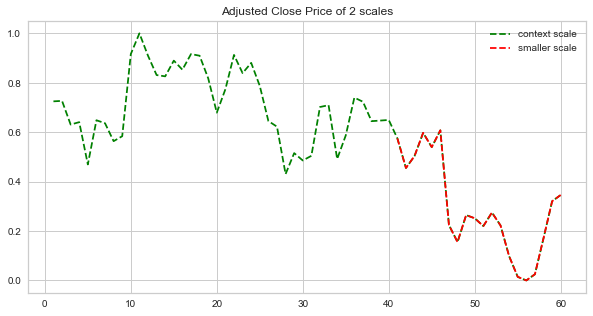

In [112]:
fig,ax = plt.subplots(figsize=(10,5))
x = np.arange(1, context_scale + 1)  
y = context_matrix[1,:]
plt.plot(x, y, color ="green", linestyle='dashed', label='context scale');
x1 = np.arange(context_scale - current_scale + 1, context_scale + 1)  
y1 = current_matrix[1,:]
plt.plot(x1, y1, color ="red", linestyle='dashed', label='smaller scale');
plt.legend();
plt.title("Adjusted Close Price of 2 scales");

In [113]:
context_embed = reduce_dimension(context_matrix, current_scale)
X_train = np.append(context_embed, current_matrix, axis = 1)
X_train.shape

(1000, 40)

# Kmeans Clustering

In [62]:
from tslearn.clustering import TimeSeriesKMeans
n_clusters = 10
model = TimeSeriesKMeans(n_clusters=n_clusters)

In [63]:
model.fit(X_train)

TimeSeriesKMeans(n_clusters=10)

In [64]:
y_train_pred = model.predict(X_train)

/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 1000 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))


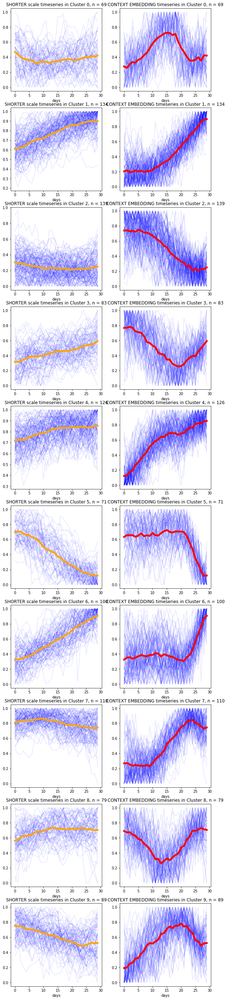

In [65]:
ncols = 2
nrows = n_clusters
fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows), squeeze=False)

for cluster in range(n_clusters): 
    indices = [i for i,x in enumerate(y_train_pred) if x == cluster]
    # TRUE time series values
    current_mean = np.mean(X_train[indices,:], axis=0)[current_scale:]
    context_mean = np.mean(X_train[indices,:], axis=0)[:current_scale]
    #context_mean = np.mean(normalize(context_matrix)[indices,:], axis=0)
    current_count = 0
    context_count = 0
    for i in range(len(indices)):
        axes[cluster,1].plot(X_train[indices[i]][:current_scale],alpha=0.1, color='blue')
        #axes[cluster,1].plot(normalize(context_matrix)[indices[i]], alpha = 0.1, color = 'blue')
        axes[cluster,0].plot(X_train[indices[i]][current_scale:],alpha=0.1, color='blue')
        current_count += 1
        context_count += 1
    axes[cluster,1].plot(context_mean,color='red',linewidth=5,alpha=1)
    axes[cluster,1].title.set_text('CONTEXT EMBEDDING timeseries in Cluster '+str(cluster) + ", n = " +str(context_count))
    axes[cluster,1].set_xlabel("days")
    #axes[cluster,1].axvline(x=current_scale - math.ceil(context_scale/current_scale)*2, color='b', linestyle='-')
    axes[cluster,0].plot(current_mean,color='orange',linewidth=5,alpha=1)
    axes[cluster,0].title.set_text('SHORTER scale timeseries in Cluster '+str(cluster)+ ", n = " +str(current_count))
    axes[cluster,0].set_xlabel("days")
    
fig.savefig('test.jpg')

# KMeans with Dynamic Time Warping

In [66]:
from tslearn.clustering import TimeSeriesKMeans
n_clusters = 10
model = TimeSeriesKMeans(n_clusters=n_clusters, metric = 'dtw')

In [67]:
model.fit(X_train)
y_train_pred = model.predict(X_train)

/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 1000 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))


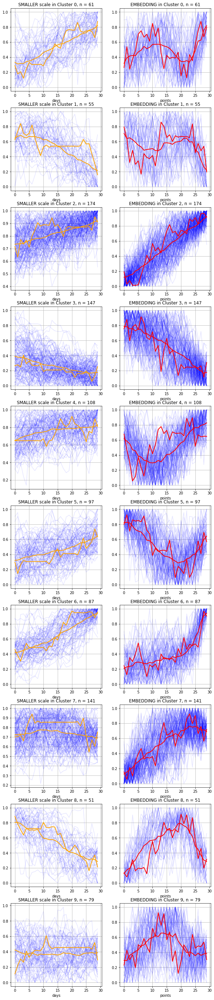

In [68]:
ncols = 2
nrows = n_clusters
fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows), squeeze=False)

for cluster in range(n_clusters): 
    indices = [i for i,x in enumerate(y_train_pred) if x == cluster]
    # TRUE time series values
    current_center = model.cluster_centers_[cluster][current_scale:]
    context_center = model.cluster_centers_[cluster][:current_scale]
    current_mean = np.mean(X_train[indices,:], axis=0)[current_scale:]
    context_mean = np.mean(X_train[indices,:], axis=0)[:current_scale]                        
    current_count = 0
    context_count = 0
    for i in range(len(indices)):
        axes[cluster,1].plot(X_train[indices[i]][:current_scale],alpha=0.1, color='blue')
        axes[cluster,0].plot(X_train[indices[i]][current_scale:],alpha=0.1, color='blue')
        current_count += 1
        context_count += 1
    axes[cluster,1].plot(context_center,color='red',linewidth=2,alpha=1)
    axes[cluster,1].title.set_text('EMBEDDING in Cluster '+str(cluster) + ", n = " +str(context_count))
    axes[cluster,1].set_xlabel("points")
    axes[cluster,1].plot(context_mean,color='red',linewidth=2,alpha=1)
    axes[cluster,1].grid()
    axes[cluster,0].plot(current_center,color='orange',linewidth=2,alpha=1)
    axes[cluster,0].title.set_text('SMALLER scale in Cluster '+str(cluster)+ ", n = " +str(current_count))
    axes[cluster,0].set_xlabel("days")
    axes[cluster,0].plot(current_mean,color='orange',linewidth=2,alpha=1)
    axes[cluster,0].grid()
fig.savefig('test.jpg')

# Naftali and Srijan suggestions

### Clustering on PIP embedding and then just plot its shorter scale time series right next to it

In [14]:
from tslearn.clustering import TimeSeriesKMeans
n_clusters = 10
model = TimeSeriesKMeans(n_clusters=n_clusters, metric = 'dtw')

/opt/anaconda3/lib/python3.7/site-packages/sklearn/utils/deprecation.py:143: FutureWarning: The sklearn.cluster.k_means_ module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.cluster. Anything that cannot be imported from sklearn.cluster is now part of the private API.
  warnings.warn(message, FutureWarning)


In [15]:
model.fit(context_embed)
y_train_pred = model.predict(context_embed)

/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 1000 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))


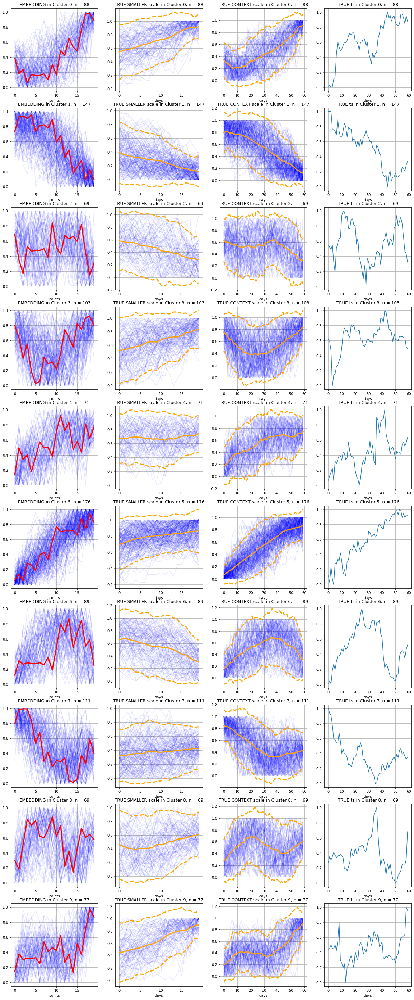

In [16]:
ncols = 4
nrows = n_clusters
fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))

for cluster in range(n_clusters):
    indices = [i for i,x in enumerate(y_train_pred) if x == cluster]
    context_center = model.cluster_centers_[cluster]
    current_mean = np.mean(current_matrix[indices,:], axis=0)
    context_mean = np.mean(context_matrix[indices,:], axis=0)
    current_std_upper = current_mean + 2*np.std(current_matrix[indices,:], axis=0)
    context_std_upper = context_mean + 2*np.std(context_matrix[indices,:], axis=0)
    current_std_lower = current_mean - 2*np.std(current_matrix[indices,:], axis=0)
    context_std_lower = context_mean - 2*np.std(context_matrix[indices,:], axis=0)
    current_count = 0
    context_count = 0
    for i in range (len(indices)):
        axes[cluster,0].plot(context_embed[indices[i]],alpha=0.1, color='blue')
        axes[cluster,1].plot(current_matrix[indices,:][i,:], alpha = 0.1, color = 'blue')
        axes[cluster,2].plot(context_matrix[indices,:][i,:], alpha = 0.1, color = 'blue')
        current_count += 1
        context_count += 1
        
    axes[cluster,0].plot(context_center, color = 'red', linewidth = 3, alpha = 1)
    axes[cluster,0].title.set_text('EMBEDDING in Cluster '+str(cluster)+ ", n = " +str(context_count))
    axes[cluster,0].grid()
    axes[cluster,0].set_xlabel("points")
    axes[cluster,1].plot(current_mean, color='orange', linewidth = 3, alpha = 1)
    axes[cluster,1].title.set_text('TRUE SMALLER scale in Cluster '+str(cluster)+ ", n = " +str(context_count))
    axes[cluster,1].set_xlabel("days")
    axes[cluster,1].grid()
    axes[cluster,1].plot(current_std_upper, linestyle='dashed', color='orange', linewidth = 3)
    axes[cluster,1].plot(current_std_lower, linestyle='dashed', color='orange', linewidth = 3)
    axes[cluster,2].plot(context_mean, color='orange', linewidth = 3, alpha = 1)
    axes[cluster,2].title.set_text('TRUE CONTEXT scale in Cluster '+str(cluster)+ ", n = " +str(context_count))
    axes[cluster,2].set_xlabel("days")
    axes[cluster,2].grid()
    axes[cluster,2].plot(context_std_upper, linestyle='dashed', color='orange', linewidth = 3)
    axes[cluster,2].plot(context_std_lower, linestyle='dashed', color='orange', linewidth = 3)
    axes[cluster,3].grid()
    axes[cluster,3].plot(context_matrix[indices,:][1,:])
    axes[cluster,3].title.set_text('TRUE ts in Cluster '+ str(cluster)+ ", n = " +str(context_count))
    axes[cluster,3].set_xlabel("days")
    
fig.savefig('embed_cluster.jpg')

## Try Romane's Silhouettes score functions

In [21]:
from tslearn.clustering import silhouette_score

silhouette_score(context_embed, y_train_pred, metric = 'dtw')

0.09201820434831089

In [22]:
def sil_sample_cluster(data, col1, col2, thresh):
  '''
  computes the percentage of silhouette scores about a threshold within each cluster
  (input) data: DataFrame; col1: str refering to cluster column; col2: str refering to silhouette scores column; thresh: float between -1 and 1
  (output) ss_scores; dictionary
  '''
  ss_scores = {}
  for i in range(data[col1].nunique()):
    subs = data[data[col1]==i]
    ss_thresh = subs[subs[col2]>=thresh]
    ss_scores[i] = len(ss_thresh)/len(subs)
  
  return ss_scores

In [23]:
from sklearn.metrics import silhouette_samples

silhouette_scores = silhouette_samples(context_embed, y_train_pred)

clusters_ss = pd.concat([pd.DataFrame(y_train_pred, columns= ['cluster']), pd.DataFrame(silhouette_scores, columns = ['silhouette_score'])], axis = 1)
clusters_ss.head() 


sil_sample_cluster(clusters_ss, 'cluster', 'silhouette_score', 0.2) #0 for all

{0: 0.0,
 1: 0.0,
 2: 0.17105263157894737,
 3: 0.2713178294573643,
 4: 0.0,
 5: 0.0,
 6: 0.0,
 7: 0.0,
 8: 0.0,
 9: 0.17647058823529413}

## Try Amaury's visualization code

In [24]:
score = []
silhouette = []
max_cluster=25

for k in range(2,max_cluster):
  cl = TimeSeriesKMeans(n_clusters=k, metric = 'dtw')
  y_train_pred = cl.fit_predict(context_embed)
  silhouette.append( silhouette_score(context_embed, y_train_pred) )
  score.append(cl.inertia_)

Text(0.5, 1.0, 'Silhouette score')

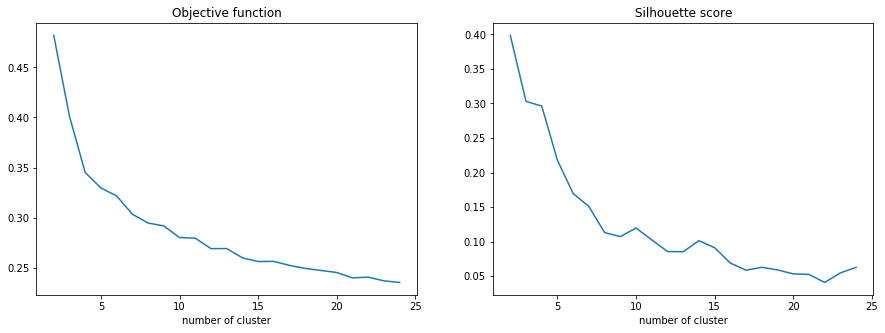

In [25]:
fig, ax = plt.subplots(1, 2, figsize=(15,5))

ax[0].plot(list(range(2,max_cluster)), score)
ax[0].set_xlabel('number of cluster')
ax[0].set_title(f'Objective function')

ax[1].plot(list(range(2,max_cluster)), silhouette)
ax[1].set_xlabel('number of cluster')
ax[1].set_title(f'Silhouette score')

## Try Kassie's yellowbrick library

In [121]:
from yellowbrick.cluster import KElbowVisualizer

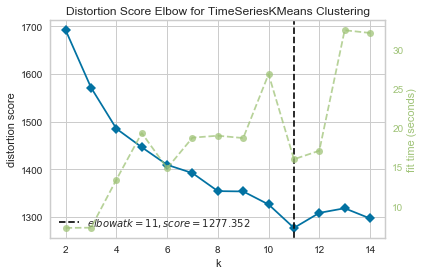

In [123]:
model1 = TimeSeriesKMeans(metric = 'dtw')
visualizer = KElbowVisualizer(model1, k=(2,15))

visualizer.fit(context_embed)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

In [124]:
from yellowbrick.cluster import SilhouetteVisualizer

/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 1000 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))


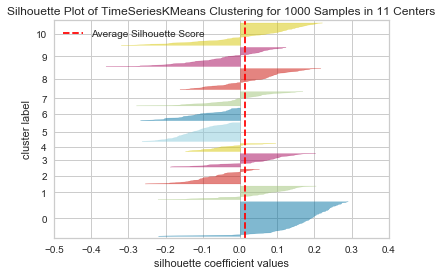

In [126]:
model1 = TimeSeriesKMeans(n_clusters=11, metric = 'dtw')
visualizer = SilhouetteVisualizer(model1, colors='yellowbrick')
visualizer.fit(context_embed)        # Fit the data to the visualizer
visualizer.show();        # Finalize and render the figure

## Try Hritik's Nested Clustering

- Still need to figure out how to stop the Visualizer from printing the plot

In [114]:
def get_optimal(data, cluster_range):
    """get the optimal number of cluster using Elbow Method
    Input:
        data (numpy array): a data matrix X
        cluster_range (tuple): a range of number of clusters
    Output:
        optimal number of cluster
    """
    matrix = data.copy()
    model = TimeSeriesKMeans(metric = 'dtw')
    visualizer = KElbowVisualizer(model, k=cluster_range)
    visualizer.fit(matrix)
    return visualizer.elbow_value_

In [115]:
# First get the PIP Embedding of the Context matrix
context_embed = reduce_dimension(context_matrix, 30)

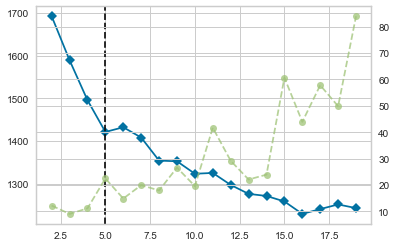

In [116]:
# Then, find the optimal number of clusters
optimal_k_context = get_optimal(context_embed, (2,20))

In [117]:
def cluster_context_embed(context_pip, current, context, n_clusters):
    """clustering on the PIP Embedding of CONTEXT scale
    Inputs:
        context_pip (numpy array): PIP Embedding of Context matrix
        current (numpy array): true Current matrix
        context (numpy array): true Context matrix
        n_clusters (int): number of clusters
    Output: Data Visualizations, 1 row is 1 cluster
        1st figure in a row: the PIP Embedding of Context matrix and the cluster centroid
        2nd figure in a row: true Current time series and their mean
                                corresponding to the PIP Embedding in the cluster
        3rd figure in a row: true Context time series and their mean
                                corresponding to the PIP Embedding in the cluster
        4th figure in a row: example of 1 true Context time series belonging to that cluster 
    """
    model_context = TimeSeriesKMeans(n_clusters=n_clusters, metric = 'dtw')
    model_context.fit(context_pip)
    # Use global variable to retain value of y_train_pred_context after calling function
    global y_train_pred_context
    y_train_pred_context = model_context.predict(context_pip)
    ncols = 4
    nrows = n_clusters
    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
    for cluster in range(n_clusters):
        indices = [i for i,x in enumerate(y_train_pred_context) if x == cluster]
        context_center = model_context.cluster_centers_[cluster]
        current_mean = np.mean(current[indices,:], axis=0)
        context_mean = np.mean(context[indices,:], axis=0)
        count = 0
        for i in range (len(indices)):
            axes[cluster,0].plot(context_pip[indices[i]],alpha=0.1, color='blue')
            axes[cluster,1].plot(current[indices,:][i,:], alpha = 0.1, color = 'blue')
            axes[cluster,2].plot(context[indices,:][i,:], alpha = 0.1, color = 'blue')
            count += 1
            
        axes[cluster,0].plot(context_center, color = 'red', linewidth = 3, alpha = 1)
        axes[cluster,0].title.set_text('CONTEXT EMBEDDING in Cluster '+str(cluster)+ ", n = " +str(count))
        axes[cluster,0].grid();
        axes[cluster,0].set_xlabel("points");
        
        axes[cluster,1].plot(current_mean, color='orange', linewidth = 3, alpha = 1)
        axes[cluster,1].title.set_text('TRUE CURRENT scale in Cluster '+str(cluster)+ ", n = " +str(count))
        axes[cluster,1].set_xlabel("days");
        axes[cluster,1].grid();
        
        axes[cluster,2].plot(context_mean, color='orange', linewidth = 3, alpha = 1)
        axes[cluster,2].title.set_text('TRUE CONTEXT scale in Cluster '+str(cluster)+ ", n = " +str(count))
        axes[cluster,2].set_xlabel("days");
        axes[cluster,2].grid();
        
        axes[cluster,3].grid();
        axes[cluster,3].plot(context[indices,:][1,:])
        axes[cluster,3].title.set_text('TRUE ts in Cluster '+ str(cluster)+ ", n = " +str(count))
        axes[cluster,3].set_xlabel("days");

/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 1000 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))


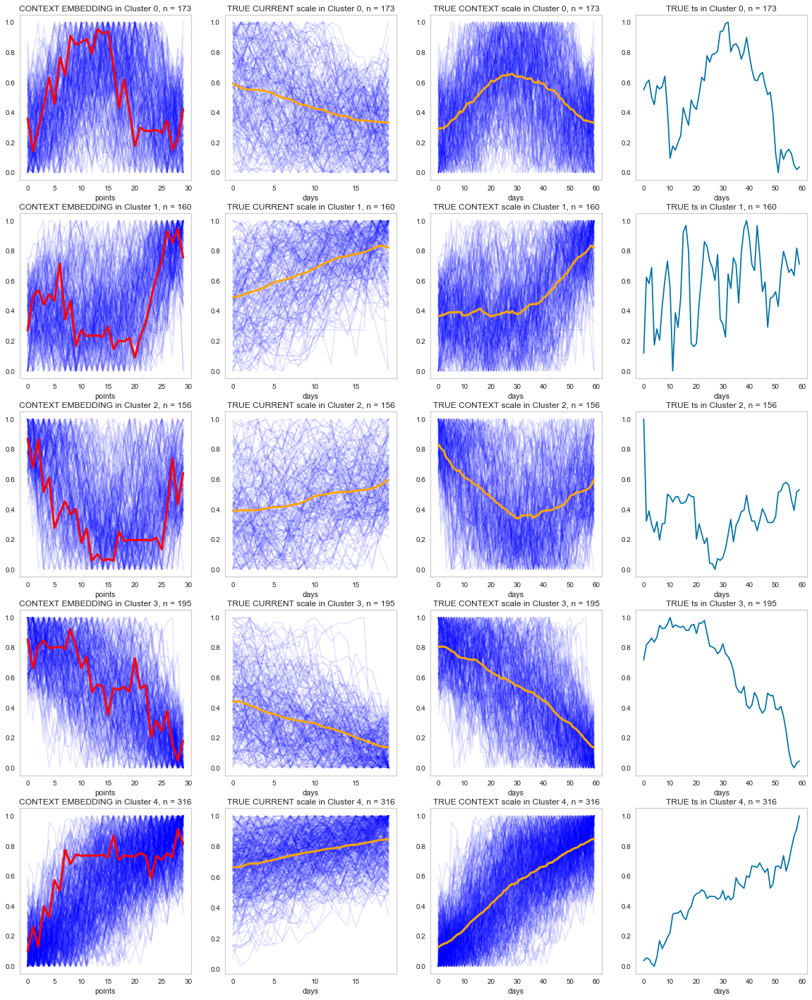

In [118]:
# Clustering on the PIP Embedding of Context matrix and print visualizations
cluster_context_embed(context_embed, current_matrix, context_matrix, optimal_k_context)

In [119]:
def cluster_current_embed(current_pip, current, context, n_clusters):
    """clustering on the PIP Embedding of CURRENT scale
    Inputs:
        current_pip (numpy array): PIP Embedding of Current matrix
        current (numpy array): true Current matrix
        context (numpy array): true Context matrix
        n_clusters (int): number of clusters
    Output: Data Visualizations, 1 row is 1 cluster
        1st figure in a row: the PIP Embedding of Current matrix and the cluster centroid
        2nd figure in a row: true Current time series and their mean
                                corresponding to the PIP Embedding in the cluster
        3rd figure in a row: true Context time series and their mean
                                corresponding to the PIP Embedding in the cluster
    """
    model_current = TimeSeriesKMeans(n_clusters=n_clusters, metric = 'dtw')
    model_current.fit(current_pip)
    y_train_pred_current = model_current.predict(current_pip)
    ncols = 3
    nrows = n_clusters
    fig, axes = plt.subplots(nrows, ncols, figsize=(5*ncols, 5*nrows))
    
    for cluster in range(n_clusters):
        indices = [i for i,x in enumerate(y_train_pred_current) if x == cluster]
        current_center = model_current.cluster_centers_[cluster]
        current_mean = np.mean(current[indices,:], axis=0)
        context_mean = np.mean(context[indices,:], axis=0)
        count = 0
        for i in range (len(indices)):
            axes[cluster,0].plot(current_pip[indices[i]],alpha=0.1, color='blue')
            axes[cluster,1].plot(current[indices,:][i,:], alpha = 0.1, color = 'blue')
            axes[cluster,2].plot(context[indices,:][i,:], alpha = 0.1, color = 'blue')
            count += 1
            
        axes[cluster,0].plot(current_center, color = 'red', linewidth = 3, alpha = 1)
        axes[cluster,0].title.set_text('CURRENT EMBEDDING in Cluster '+str(cluster)+ ", n = " +str(count))
        axes[cluster,0].grid();
        axes[cluster,0].set_xlabel("points")
        
        axes[cluster,1].plot(current_mean, color='orange', linewidth = 3, alpha = 1)
        axes[cluster,1].title.set_text('TRUE CURRENT scale in Cluster '+str(cluster)+ ", n = " +str(count))
        axes[cluster,1].set_xlabel("days");
        axes[cluster,1].grid();
        
        axes[cluster,2].plot(context_mean, color='orange', linewidth = 3, alpha = 1)
        axes[cluster,2].title.set_text('TRUE CONTEXT scale in Cluster '+str(cluster)+ ", n = " +str(count))
        axes[cluster,2].set_xlabel("days");
        axes[cluster,2].grid();

/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 173 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))
/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 160 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))
/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 156 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))
/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 195 1-dimensional timeseries
  '{} 1-dimensional timeseries'.format(X.shape[0]))
/opt/anaconda3/lib/python3.7/site-packages/tslearn/utils.py:91: UserWarning: 2-Dimensional data passed. Assuming these are 316 1-dimensional timeseries
  '{} 1-dimensional timeseries'.

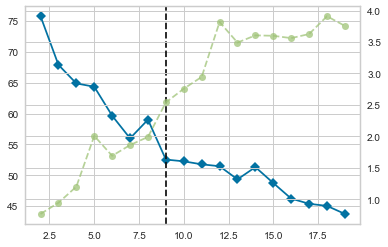

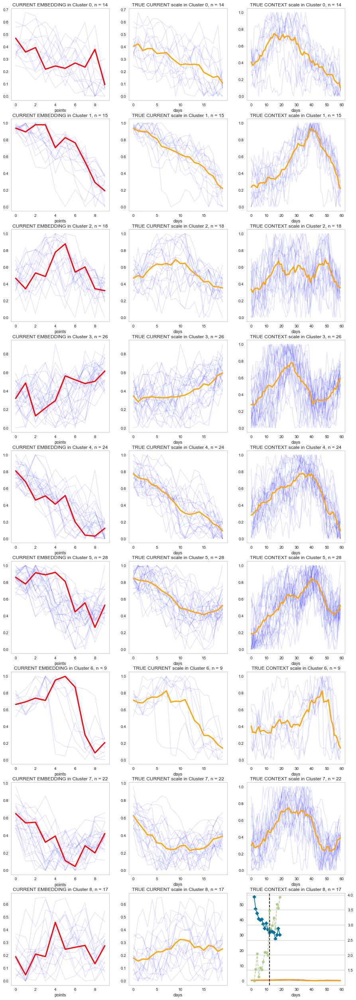

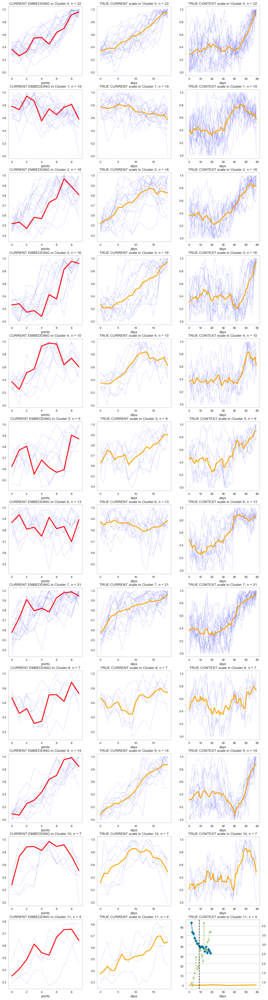

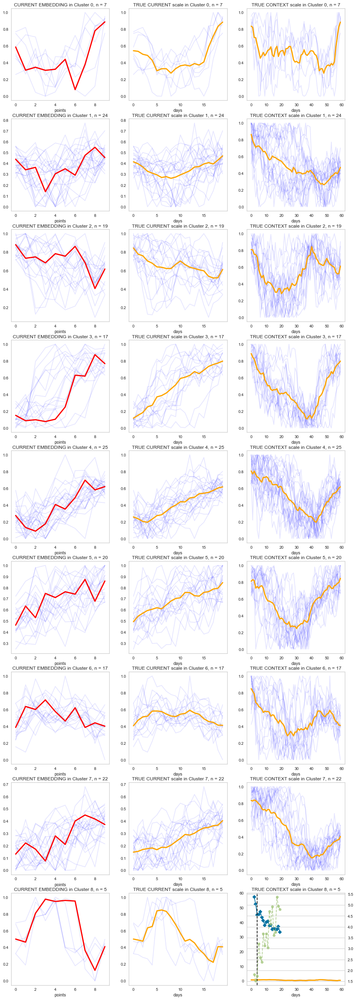

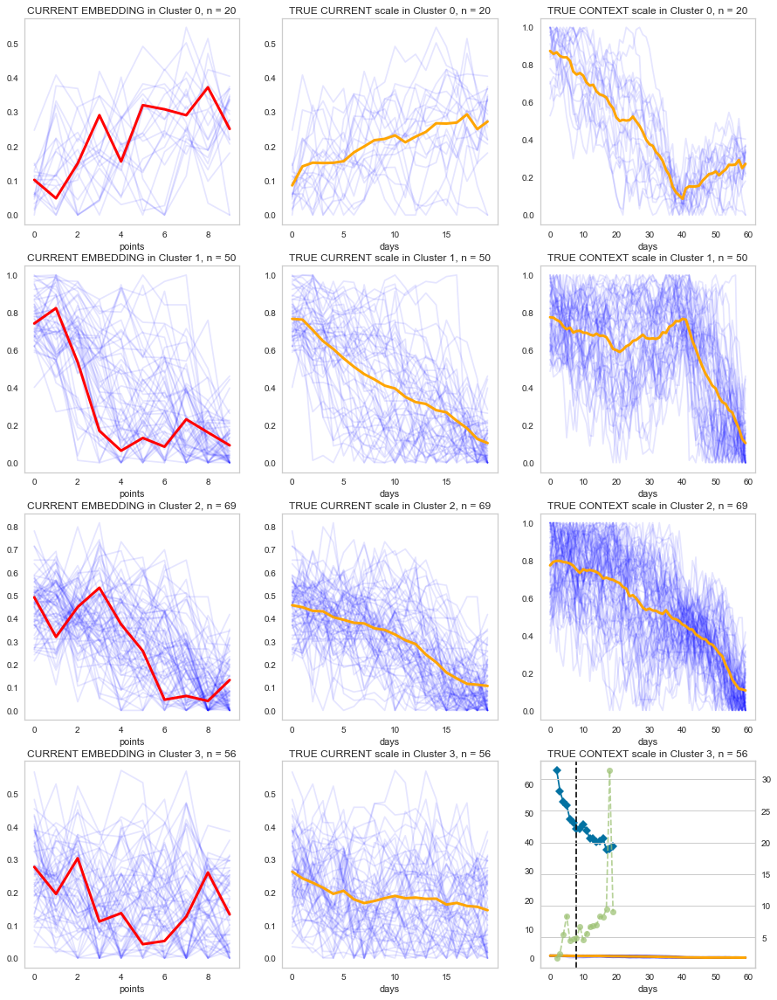

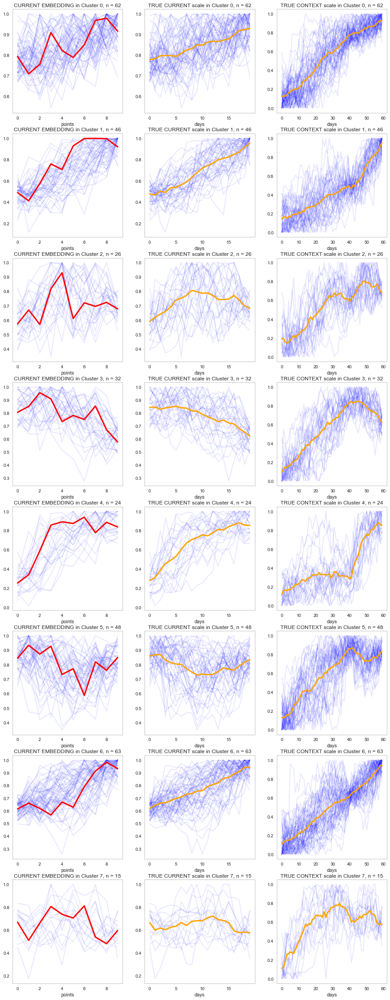

In [120]:
# For each cluster in the Context scale clustering:
for j in range(optimal_k_context):
    # First get the indices
    indices_current = [i for i,x in enumerate(y_train_pred_context) if x == j]
    # Then find the PIP Embedding of Current matrix with that indices
    current_embed = reduce_dimension(current_matrix[indices_current],10) # Here, I reduce the length to 10
    # Then get the optimal number of clusters
    n_clusters_current = get_optimal(current_embed, (2,20))
    current_cluster = current_matrix[indices_current]
    context_cluster = context_matrix[indices_current]
    # Cluster on the PIP Embedding of Current Scale and plot visualizations
    cluster_current_embed(current_embed, current_cluster, context_cluster, n_clusters_current)